# Benchmark deconvolution performance using synthetic donut-shaped data (Fig 2 and Fig S8-13)

In [1]:
import os
import itertools
import torch
import numpy as np
import pandas as pd
import scipy as sp
import scipy.io as sio
from smoother import SpatialWeightMatrix, SpatialLoss
from smoother.models.deconv import NNLS, NuSVR, DWLS, LogNormReg
from smoother.visualization import *

import matplotlib
import matplotlib.pyplot as plt
from plotnine import *

In [2]:
DATA_FOLDER = "/Users/jysumac/Projects/Smoother_paper/data/synthetic_deconv/donut/"
RES_FOLDER = "/Users/jysumac/Projects/Smoother_paper/results/synthetic_deconv/donut/"

## Deconvolution on a single experiment (top50 marker genes per cell type, no contamination)

### Load data

In [3]:
DATA_DIR = f"{DATA_FOLDER}/ne10_rz15_nm50_sm0/"
ANNO_DIR = DATA_DIR

# load true celltype abundances
ab_true = pd.read_csv(ANNO_DIR + f"/celltype_abundances.csv", header = 0, index_col = 0)
celltypes = ab_true.columns

# calculate proportion
p_true = pd.DataFrame(
    ab_true.to_numpy() / (ab_true.to_numpy().sum(axis=1, keepdims=True) + 1e-10),
    index = ab_true.index, columns = ab_true.columns
)

# load celltype annotation
design = pd.read_csv(ANNO_DIR + f"/celltype_zone_assignment.csv", header = 0, index_col = 0)
design = design.loc[celltypes,:]

# load data of one experiment (replication)
EXP_ID = 0
p_true_exp = p_true.iloc[(2500*EXP_ID):(2500 + 2500*EXP_ID),:].to_numpy()

# spatial coorditates
coords = pd.read_csv(f"{DATA_DIR}/deconv_inputs/coords_exp{EXP_ID}.csv", 
                     header = 0, index_col = 0)

# spatial counts
sp_counts = sio.mmread(
    f"{DATA_DIR}/deconv_inputs/syn_sp_count_markers_exp{EXP_ID}.mtx"
).toarray().T

# reference count matrices
ref_raw_counts = pd.read_csv(
    f"{DATA_DIR}/deconv_inputs/ref_avg_raw_count_markers.csv", header = 0, index_col = 0)
ref_raw_counts = ref_raw_counts[celltypes]

ref_norm_counts = pd.read_csv(
    f"{DATA_DIR}/deconv_inputs/ref_avg_norm_count_markers.csv", header = 0, index_col = 0)
ref_norm_counts = ref_norm_counts[celltypes]

print(f"Number of genes: {ref_norm_counts.shape[0]}")
print(f"Number of celltypes: {ref_norm_counts.shape[1]}")
print(f"Number of spots: {sp_counts.shape[1]}")


# convert data into torch tensor
x_raw_c = torch.tensor(ref_raw_counts.values).float()
x_norm_c = torch.tensor(ref_norm_counts.values).float()
y_c = torch.tensor(sp_counts).float()


x_raw_lc = torch.log1p(x_raw_c)
x_norm_lc = torch.log1p(x_norm_c)
y_lc = torch.log1p(y_c)

Number of genes: 656
Number of celltypes: 15
Number of spots: 2500


### Check data properties

#### Check number of cells per spot

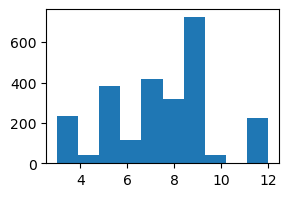

In [6]:
with plt.rc_context({"figure.figsize": (3, 2)}):
    plt.hist((p_true_exp > 0).sum(1))

#### Check abundance pattern

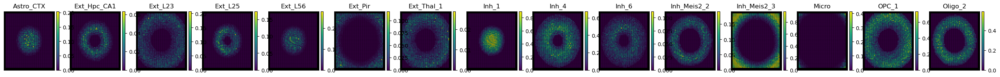

In [11]:
plot_celltype_props(p_true_exp, coords, cell_type_names=celltypes, 
                    n_col=len(celltypes), figsize=[2.2*len(celltypes), 2])

### Test different deconvolution preprocessing strategies

#### Raw reference + log-scale

In [12]:
torch.manual_seed(20220629)

# calculate spatial weight matrix
weights = SpatialWeightMatrix()
weights.calc_weights_knn(coords)
weights.scale_by_expr(y_lc)

# prepare spatial loss
spatial_loss = SpatialLoss('icar', weights, rho = 0.99)

# deconvolution
method_names = ['NNLS', 'NNLS + spatial',
                'SVR', 'SVR + spatial',
                'DWLS', 'DWLS + spatial',
                'LNR', 'LNR + spatial']

deconv_configs = {'max_epochs':-1, 'lr':1e-2, 'verbose':False}

# NNLS
nnls_wo_ss = NNLS()
nnls_wo_ss.deconv(x_raw_lc, y_lc, None, lambda_spatial_loss=0, **deconv_configs)
nnls_w_ss = NNLS()
nnls_w_ss.deconv(x_raw_lc, y_lc, spatial_loss, lambda_spatial_loss=1, **deconv_configs)

# Nu-SVR
svr_wo_ss = NuSVR(nonneg=True, nu=0.5)
svr_wo_ss.deconv(x_raw_lc, y_lc, None, lambda_spatial_loss=0, **deconv_configs)
svr_w_ss = NuSVR(nonneg=True, nu=0.5)
svr_w_ss.deconv(x_raw_lc, y_lc, spatial_loss, lambda_spatial_loss=1, **deconv_configs)

# DWLS
dwls_wo_ss = DWLS(nonneg=True, max_weights=4)
dwls_wo_ss.deconv(x_raw_lc, y_lc, None, lambda_spatial_loss=0, **deconv_configs)
dwls_w_ss = DWLS(nonneg=True, max_weights=4)
dwls_w_ss.deconv(x_raw_lc, y_lc, spatial_loss, lambda_spatial_loss=3, **deconv_configs)

# LogNormRegression
lnr_wo_ss = LogNormReg()
lnr_wo_ss.deconv(x_raw_c, y_c, None, lambda_spatial_loss=0, **deconv_configs)
lnr_w_ss = LogNormReg()
lnr_w_ss.deconv(x_raw_c, y_c, spatial_loss, lambda_spatial_loss=1, **deconv_configs)

# merge and extract results
deconv_models = [nnls_wo_ss, nnls_w_ss,
                 svr_wo_ss, svr_w_ss,
                 dwls_wo_ss, dwls_w_ss,
                 lnr_wo_ss, lnr_w_ss]

prop_inf = [m.get_props().numpy() for m in deconv_models]

Number of spots: 2500. Average number of neighbors per spot:  5.37.
Number of spots: 2500. Average number of neighbors per spot:  5.37.
=== Time  0.86s. Total epoch 184. Final loss: (total) 0.319. (spatial) 0.000.
=== Time  0.94s. Total epoch 169. Final loss: (total) 0.324. (spatial) 0.002.
=== Time  1.87s. Total epoch 164. Final loss: (total) 0.322. (spatial) 0.000.
=== Time  1.94s. Total epoch 154. Final loss: (total) 0.324. (spatial) 0.001.
=== Time  1.82s. Total epoch 210. Final loss: (total) 1.065. (spatial) 0.000.
=== Time  1.85s. Total epoch 193. Final loss: (total) 1.076. (spatial) 0.007.
=== Time  4.32s. Total epoch 519. Final loss: (total) 0.317. (spatial) 0.000.
=== Time  7.55s. Total epoch 764. Final loss: (total) 0.323. (spatial) 0.004.


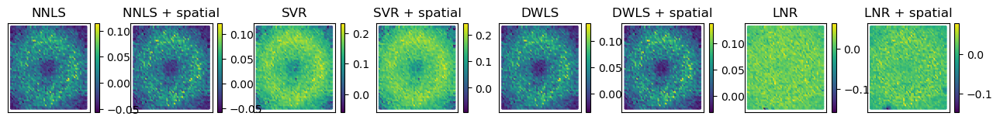

In [13]:
# check per-spot residues
bias = [m.lr.bias.data.numpy() for m in deconv_models]
res = []
# visualization
# colored by coefficients layer-by-layer
fig, axes = plt.subplots(
    1, len(method_names), 
    figsize=(2*len(method_names), 1.5)
)

for m, name in enumerate(method_names):
    axes[m].set_title(name)
    scat = axes[m].scatter(coords['x'], coords['y'], c = bias[m][:], s = 3)
    cbar = fig.colorbar(scat, ax=axes[m])

for ax in axes.flatten():
    ax.set_xticks([])
    ax.set_yticks([])

plt.show()

#### Normalized reference + log-scale

In [14]:
torch.manual_seed(20220629)

# calculate spatial weight matrix
weights = SpatialWeightMatrix()
weights.calc_weights_knn(coords)
weights.scale_by_expr(y_lc)

# prepare spatial loss
spatial_loss = SpatialLoss('icar', weights, rho = 0.99)

# deconvolution
method_names += ['NNLS-N', 'NNLS-N + spatial',
                'SVR-N', 'SVR-N + spatial',
                'DWLS-N', 'DWLS-N + spatial',
                'LNR-N', 'LNR-N + spatial']

deconv_configs = {'max_epochs':-1, 'lr':1e-2, 'verbose':False}

# NNLS
nnls_wo_ss = NNLS()
nnls_wo_ss.deconv(x_norm_lc, y_lc, None, lambda_spatial_loss=0, **deconv_configs)
nnls_w_ss = NNLS()
nnls_w_ss.deconv(x_norm_lc, y_lc, spatial_loss, lambda_spatial_loss=1, **deconv_configs)

# Nu-SVR
svr_wo_ss = NuSVR(nonneg=True, nu=0.5)
svr_wo_ss.deconv(x_norm_lc, y_lc, None, lambda_spatial_loss=0, **deconv_configs)
svr_w_ss = NuSVR(nonneg=True, nu=0.5)
svr_w_ss.deconv(x_norm_lc, y_lc, spatial_loss, lambda_spatial_loss=1, **deconv_configs)

# DWLS
dwls_wo_ss = DWLS(nonneg=True, max_weights=4)
dwls_wo_ss.deconv(x_norm_lc, y_lc, None, lambda_spatial_loss=0, **deconv_configs)
dwls_w_ss = DWLS(nonneg=True, max_weights=4)
dwls_w_ss.deconv(x_norm_lc, y_lc, spatial_loss, lambda_spatial_loss=3, **deconv_configs)

lnr_wo_ss = LogNormReg()
lnr_wo_ss.deconv(x_norm_c, y_c, None, lambda_spatial_loss=0, **deconv_configs)
lnr_w_ss = LogNormReg()
lnr_w_ss.deconv(x_norm_c, y_c, spatial_loss, lambda_spatial_loss=1, **deconv_configs)

# merge and extract results
deconv_models = [nnls_wo_ss, nnls_w_ss,
                 svr_wo_ss, svr_w_ss,
                 dwls_wo_ss, dwls_w_ss,
                 lnr_wo_ss, lnr_w_ss]

prop_inf += [m.get_props().numpy() for m in deconv_models]

Number of spots: 2500. Average number of neighbors per spot:  5.37.
Number of spots: 2500. Average number of neighbors per spot:  5.37.
=== Time  0.71s. Total epoch 150. Final loss: (total) 0.319. (spatial) 0.000.
=== Time  0.82s. Total epoch 141. Final loss: (total) 0.321. (spatial) 0.002.
=== Time  1.61s. Total epoch 140. Final loss: (total) 0.317. (spatial) 0.000.
=== Time  1.69s. Total epoch 134. Final loss: (total) 0.318. (spatial) 0.001.
=== Time  1.54s. Total epoch 188. Final loss: (total) 1.054. (spatial) 0.000.
=== Time  1.61s. Total epoch 170. Final loss: (total) 1.061. (spatial) 0.004.
=== Time  2.18s. Total epoch 276. Final loss: (total) 0.316. (spatial) 0.000.
=== Time  3.05s. Total epoch 333. Final loss: (total) 0.318. (spatial) 0.001.


#### Raw reference + raw counts

In [15]:
# convert data into torch tensor
x_raw_c = torch.tensor(ref_raw_counts.values).float()
y_c = torch.tensor(sp_counts).float()

# normalize reference and the st data for faster convergence
# also the lambda_sp_loss would be more intuitive
norm_factor = y_c.mean() * 10
y_c = y_c / norm_factor
x_raw_c = x_raw_c / norm_factor

In [16]:
torch.manual_seed(20220629)

# calculate spatial weight matrix
weights = SpatialWeightMatrix()
weights.calc_weights_knn(coords)
weights.scale_by_expr(y_c)

# prepare spatial loss
spatial_loss = SpatialLoss('icar', weights, rho = 0.99)

# deconvolution
method_names += ['NNLS-RC', 'NNLS-RC + spatial',
                'SVR-RC', 'SVR-RC + spatial',
                'DWLS-RC', 'DWLS-RC + spatial',
                'LNR-RC', 'LNR-RC + spatial']

deconv_configs = {'max_epochs':-1, 'lr':1e-2, 'verbose':False}

# NNLS
nnls_wo_ss = NNLS()
nnls_wo_ss.deconv(x_raw_c, y_c, None, lambda_spatial_loss=0, **deconv_configs)
nnls_w_ss = NNLS()
nnls_w_ss.deconv(x_raw_c, y_c, spatial_loss, lambda_spatial_loss=1, **deconv_configs)

# Nu-SVR
svr_wo_ss = NuSVR(nonneg=True, nu=0.5)
svr_wo_ss.deconv(x_raw_c, y_c, None, lambda_spatial_loss=0, **deconv_configs)
svr_w_ss = NuSVR(nonneg=True, nu=0.5)
svr_w_ss.deconv(x_raw_c, y_c, spatial_loss, lambda_spatial_loss=1, **deconv_configs)

# DWLS
dwls_wo_ss = DWLS(nonneg=True, max_weights=4)
dwls_wo_ss.deconv(x_raw_c, y_c, None, lambda_spatial_loss=0, **deconv_configs)
dwls_w_ss = DWLS(nonneg=True, max_weights=4)
dwls_w_ss.deconv(x_raw_c, y_c, spatial_loss, lambda_spatial_loss=3, **deconv_configs)

# LogNormRegression
lnr_wo_ss = LogNormReg()
lnr_wo_ss.deconv(x_raw_c, y_c, None, lambda_spatial_loss=0, **deconv_configs)
lnr_w_ss = LogNormReg()
lnr_w_ss.deconv(x_raw_c, y_c, spatial_loss, lambda_spatial_loss=1, **deconv_configs)

# merge and extract results
deconv_models = [nnls_wo_ss, nnls_w_ss,
                 svr_wo_ss, svr_w_ss,
                 dwls_wo_ss, dwls_w_ss,
                 lnr_wo_ss, lnr_w_ss]

prop_inf += [m.get_props().numpy() for m in deconv_models]

Number of spots: 2500. Average number of neighbors per spot:  5.37.
Number of spots: 2500. Average number of neighbors per spot:  5.37.
=== Time  5.13s. Total epoch 1185. Final loss: (total) 0.188. (spatial) 0.000.
=== Time  6.10s. Total epoch 1115. Final loss: (total) 0.197. (spatial) 0.005.
=== Time  6.91s. Total epoch 596. Final loss: (total) 0.238. (spatial) 0.000.
=== Time  5.28s. Total epoch 427. Final loss: (total) 0.301. (spatial) 0.020.
=== Time  12.26s. Total epoch 1505. Final loss: (total) 0.451. (spatial) 0.000.
=== Time  12.98s. Total epoch 1371. Final loss: (total) 0.467. (spatial) 0.008.
=== Time  3.51s. Total epoch 441. Final loss: (total) 0.025. (spatial) 0.000.
=== Time  10.11s. Total epoch 1140. Final loss: (total) 0.028. (spatial) 0.002.


#### Raw reference + sqrt-scale

In [17]:
# convert data into torch tensor
x_raw_c = torch.tensor(ref_norm_counts.values).float()
y_c = torch.tensor(sp_counts).float()
x_raw_sqrt = torch.sqrt(x_raw_c)
y_sqrt = torch.sqrt(y_c)

In [18]:
torch.manual_seed(20220629)

# calculate spatial weight matrix
weights = SpatialWeightMatrix()
weights.calc_weights_knn(coords)
weights.scale_by_expr(y_sqrt)

# prepare spatial loss
spatial_loss = SpatialLoss('icar', weights, rho = 0.99)

# deconvolution
method_names += ['NNLS-S', 'NNLS-S + spatial',
                'SVR-S', 'SVR-S + spatial',
                'DWLS-S', 'DWLS-S + spatial']

deconv_configs = {'max_epochs':-1, 'lr':1e-2, 'verbose':False}

# NNLS
nnls_wo_ss = NNLS()
nnls_wo_ss.deconv(x_raw_sqrt, y_sqrt, None, lambda_spatial_loss=0, **deconv_configs)
nnls_w_ss = NNLS()
nnls_w_ss.deconv(x_raw_sqrt, y_sqrt, spatial_loss, lambda_spatial_loss=1, **deconv_configs)

# Nu-SVR
svr_wo_ss = NuSVR(nonneg=True, nu=0.5)
svr_wo_ss.deconv(x_raw_sqrt, y_sqrt, None, lambda_spatial_loss=0, **deconv_configs)
svr_w_ss = NuSVR(nonneg=True, nu=0.5)
svr_w_ss.deconv(x_raw_sqrt, y_sqrt, spatial_loss, lambda_spatial_loss=1, **deconv_configs)

# DWLS
dwls_wo_ss = DWLS(nonneg=True, max_weights=4)
dwls_wo_ss.deconv(x_raw_sqrt, y_sqrt, None, lambda_spatial_loss=0, **deconv_configs)
dwls_w_ss = DWLS(nonneg=True, max_weights=4)
dwls_w_ss.deconv(x_raw_sqrt, y_sqrt, spatial_loss, lambda_spatial_loss=3, **deconv_configs)

# merge and extract results
deconv_models = [nnls_wo_ss, nnls_w_ss,
                 svr_wo_ss, svr_w_ss,
                 dwls_wo_ss, dwls_w_ss]

prop_inf += [m.get_props().numpy() for m in deconv_models]

Number of spots: 2500. Average number of neighbors per spot:  5.37.
Number of spots: 2500. Average number of neighbors per spot:  5.37.
=== Time  1.47s. Total epoch 328. Final loss: (total) 0.865. (spatial) 0.000.
=== Time  1.69s. Total epoch 307. Final loss: (total) 0.869. (spatial) 0.003.
=== Time  3.98s. Total epoch 343. Final loss: (total) 0.779. (spatial) 0.000.
=== Time  3.90s. Total epoch 325. Final loss: (total) 0.782. (spatial) 0.002.
=== Time  3.84s. Total epoch 449. Final loss: (total) 2.767. (spatial) 0.000.
=== Time  3.89s. Total epoch 411. Final loss: (total) 2.777. (spatial) 0.007.


### Evaluate deconvolution performance

#### Plot inferred cell type proportions

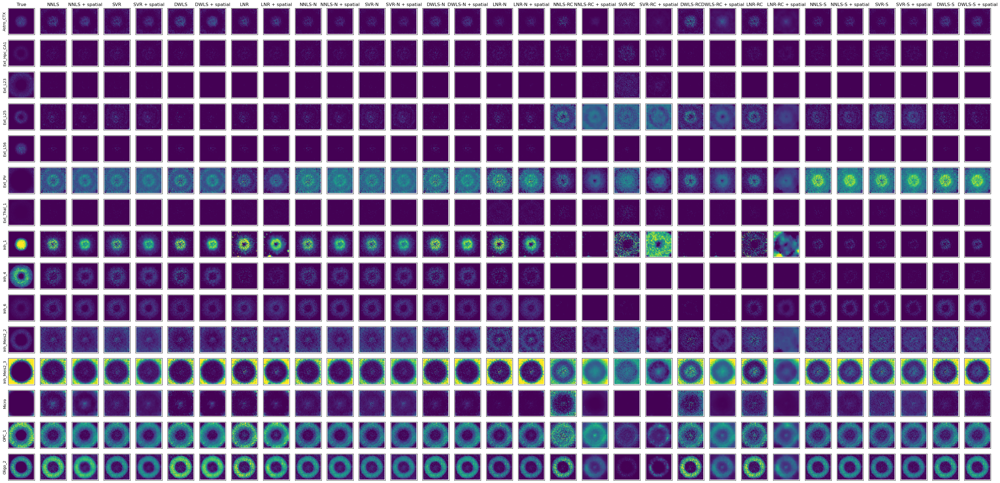

In [19]:
ct_to_plot = celltypes
ct_idx = [np.nonzero(celltypes == ct)[0].item() for ct in ct_to_plot]

# visualization
# colored by coefficients layer-by-layer
fig, axes = plt.subplots(
    len(ct_idx), len(method_names) + 1, 
    figsize=(1.5*(len(method_names) + 1), 1.5*len(ct_idx))
)
for i, idx in enumerate(ct_idx):
    if len(ct_idx) == 1:
        ax = axes
    else:
        ax = axes[i]
    ax[0].scatter(coords['x'], coords['y'], c = p_true_exp[:,idx], s = 3, vmin=0, vmax=0.6)
    
    for m, name in enumerate(method_names):
        ax[1 + m].scatter(coords['x'], coords['y'], c = prop_inf[m][:, idx], s = 3, vmin=0, vmax=0.6)
        if i == 0:
            ax[1 + m].set_title(name)
    
    ax[0].set_ylabel(celltypes[idx])

if len(ct_idx) == 1:
    ax = axes
else:
    ax = axes[0]
ax[0].set_title("True")

for ax in axes.flatten():
    ax.set_xticks([])
    ax.set_yticks([])
plt.show()

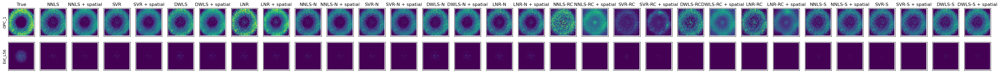

In [20]:
ct_to_plot = ['OPC_1', 'Ext_L56']
ct_idx = [np.nonzero(design.index == ct)[0].item() for ct in ct_to_plot]

# visualization
# colored by coefficients layer-by-layer
fig, axes = plt.subplots(
    len(ct_idx), len(method_names) + 1, 
    figsize=(1.5*(len(method_names) + 1), 1.5*len(ct_idx))
)
for i, idx in enumerate(ct_idx):
    if len(ct_idx) == 1:
        ax = axes
    else:
        ax = axes[i]
    ax[0].scatter(coords['x'], coords['y'], c = p_true_exp[:,idx], s = 3, vmin=0, vmax=0.6)
    
    for m, name in enumerate(method_names):
        ax[1 + m].scatter(coords['x'], coords['y'], c = prop_inf[m][:, idx], s = 3, vmin=0, vmax=0.6)
        if i == 0:
            ax[1 + m].set_title(name)
    
    ax[0].set_ylabel(design.index[idx])

if len(ct_idx) == 1:
    ax = axes
else:
    ax = axes[0]
ax[0].set_title("True")

for ax in axes.flatten():
    ax.set_xticks([])
    ax.set_yticks([])
plt.show()

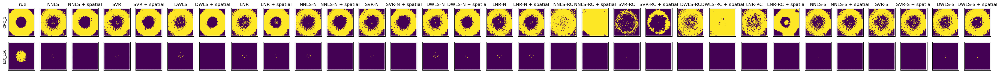

In [21]:
ct_to_plot = ['OPC_1', 'Ext_L56']
ct_idx = [np.nonzero(design.index == ct)[0].item() for ct in ct_to_plot]

# visualization
# colored by coefficients layer-by-layer
fig, axes = plt.subplots(
    len(ct_idx), len(method_names) + 1, 
    figsize=(1.5*(len(method_names) + 1), 1.5*len(ct_idx))
)
for i, idx in enumerate(ct_idx):
    if len(ct_idx) == 1:
        ax = axes
    else:
        ax = axes[i]
    ax[0].scatter(coords['x'], coords['y'], c = p_true_exp[:,idx] > 0.05, s = 3)
    
    for m, name in enumerate(method_names):
        ax[1 + m].scatter(coords['x'], coords['y'], c = prop_inf[m][:, idx] >= 0.1, s = 3)
        if i == 0:
            ax[1 + m].set_title(name)
    
    ax[0].set_ylabel(design.index[idx])

if len(ct_idx) == 1:
    ax = axes
else:
    ax = axes[0]
ax[0].set_title("True")

for ax in axes.flatten():
    ax.set_xticks([])
    ax.set_yticks([])
plt.show()

#### Compare absolute errors and pearson correlations

In [22]:
# absolute error of celltype proportions
abs_error = np.stack([((p_true_exp - prop) ** 2).sum(axis=0) for prop in prop_inf], axis=1)
abs_error = pd.DataFrame(abs_error, columns = method_names)
abs_error['cell_type'] = celltypes
abs_error['is_high_density'] = design['is_high_density'][abs_error['cell_type']].values
abs_error = pd.melt(
    abs_error, id_vars=['cell_type', 'is_high_density'],
    var_name='model', value_name='abs_error'
)
abs_error['spatial_loss'] = abs_error['model'].str.contains('spatial')
abs_error['spatial_loss_class'] = pd.Categorical(abs_error.spatial_loss, [True, False])
abs_error['deconv_model'] = abs_error['model'].str.split('+').str[0].str.strip()
abs_error['class'] = np.where(abs_error.is_high_density, 'High abundance', 'Low abundance')

# pearson r of true and predicted proportions
corr_df = np.stack([
    np.array([np.corrcoef(p_true_exp[:,i].flatten(), prop[:, i].flatten())[0,1]
     for i in range(prop.shape[1])])
    for prop in prop_inf], axis = 1)
corr_df = pd.DataFrame(corr_df, columns = method_names)
corr_df['cell_type'] = celltypes
corr_df['is_high_density'] = design['is_high_density'][corr_df['cell_type']].values
corr_df = pd.melt(
    corr_df, id_vars=['cell_type', 'is_high_density'],
    var_name='model', value_name='pearson_r'
)
corr_df['spatial_loss'] = corr_df['model'].str.contains('spatial')
corr_df['spatial_loss_class'] = pd.Categorical(corr_df.spatial_loss, [True, False])
corr_df['deconv_model'] = corr_df['model'].str.split('+').str[0].str.strip()
corr_df['class'] = np.where(corr_df.is_high_density, 'High abundance', 'Low abundance')

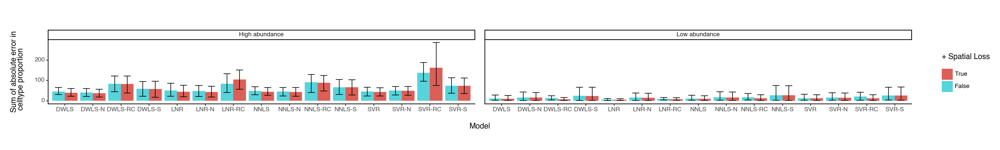

<Figure Size: (2000 x 300)>

In [23]:
ggplot(abs_error, aes(x='deconv_model', y = 'abs_error', group = 'model')) + \
    facet_wrap('~ class', scales = 'fixed', nrow=1) + \
    geom_bar(aes(fill = 'spatial_loss_class'),
                position = "dodge", stat = "summary",
                fun_y = np.mean) + \
    geom_errorbar(stat = "summary", position = position_dodge(width=0.9)) + \
    labs(x = 'Model', y = 'Sum of absolute error in\n celltype proportion', fill = '+ Spatial Loss') + \
    theme_classic() + \
    theme(figure_size = (20, 3))

/var/folders/_f/m4v2g8c54gdfks59bp2f2cm80000gn/T/ipykernel_13787/2669540247.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/jysumac/miniforge3/envs/smoother/lib/python3.10/site-packages/plotnine/themes/themeable.py:1902: FutureWarning: You no longer need to use subplots_adjust to make space for the legend or text around the panels. This paramater will be removed in a future version. You can still use 'plot_margin' 'panel_spacing' for your other spacing needs.


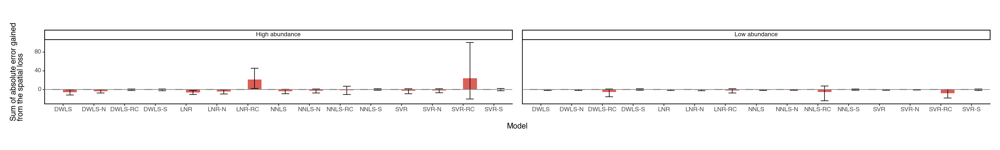

<Figure Size: (2000 x 300)>

In [24]:
df = abs_error.sort_values(by = ['cell_type', 'deconv_model'])
df_diff_err = df[['cell_type', 'deconv_model', 'class', 'spatial_loss', 'spatial_loss_class', 'model']]
df_diff_err['err_diff'] = df['abs_error'].to_numpy() - \
    np.repeat(df[~df.spatial_loss]['abs_error'].to_numpy(), 2)

ggplot(df_diff_err, aes(x='deconv_model', y = 'err_diff', fill = 'spatial_loss', group = 'model')) + \
    facet_wrap('~ class', scales = 'fixed', nrow=1) + \
    geom_bar(aes(fill = 'spatial_loss_class'),
                position = "dodge", stat = "summary",
                fun_y = np.mean) + \
    geom_errorbar(stat = "summary", position = position_dodge(width=0.9)) + \
    geom_hline(yintercept = 0, color = 'gray') + \
    labs(x = 'Model', y = 'Sum of absolute error gained\nfrom the spatial loss', fill = 'Has spatial loss') + \
    theme_classic() + \
        theme(figure_size = (20, 3), subplots_adjust={'wspace': 0.25}, legend_position='none')

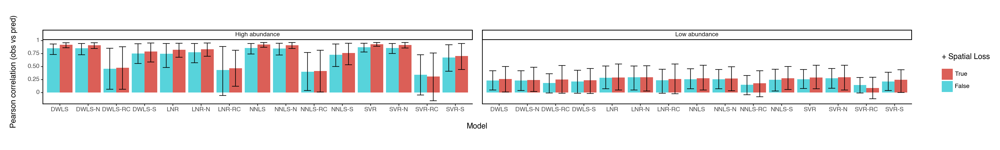

<Figure Size: (2000 x 300)>

In [25]:
ggplot(corr_df, aes(x='deconv_model', y = 'pearson_r', group = 'model')) + \
    facet_wrap('~ class', scales = 'fixed', nrow=1) + \
    geom_bar(aes(fill = 'spatial_loss_class'),
                position = "dodge", stat = "summary",
                fun_y = np.mean) + \
    geom_errorbar(stat = "summary", position = position_dodge(width=0.9)) + \
    labs(x = 'Model', y = 'Pearson correlation (obs vs pred)', fill = '+ Spatial Loss') + \
    theme_classic() + \
    theme(figure_size = (20, 3))

/var/folders/_f/m4v2g8c54gdfks59bp2f2cm80000gn/T/ipykernel_13787/2755600984.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/jysumac/miniforge3/envs/smoother/lib/python3.10/site-packages/plotnine/themes/themeable.py:1902: FutureWarning: You no longer need to use subplots_adjust to make space for the legend or text around the panels. This paramater will be removed in a future version. You can still use 'plot_margin' 'panel_spacing' for your other spacing needs.


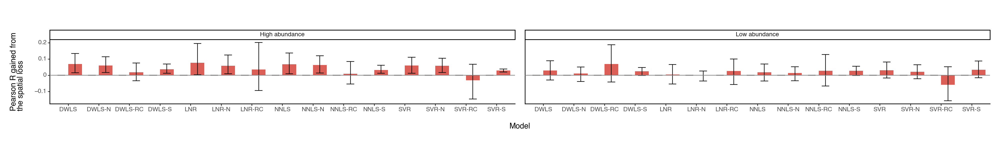

<Figure Size: (2000 x 300)>

In [26]:
df = corr_df.sort_values(by = ['cell_type', 'deconv_model'])
df_diff_corr = df[['cell_type', 'deconv_model', 'class', 'spatial_loss', 'spatial_loss_class', 'model']]
df_diff_corr['r_diff'] = df['pearson_r'].to_numpy() - \
    np.repeat(df[~df.spatial_loss]['pearson_r'].to_numpy(), 2)

ggplot(df_diff_corr, aes(x='deconv_model', y = 'r_diff', fill = 'spatial_loss', group = 'model')) + \
    facet_wrap('~ class', scales = 'fixed', nrow=1) + \
    geom_bar(aes(fill = 'spatial_loss_class'),
                position = "dodge", stat = "summary",
                fun_y = np.mean) + \
    geom_errorbar(stat = "summary", position = position_dodge(width=0.9)) + \
    geom_hline(yintercept = 0, color = 'gray') + \
    labs(x = 'Model', y = 'Pearson R gained from\nthe spatial loss', fill = 'Has spatial loss') + \
    theme_classic() + \
    theme(figure_size = (20, 3), subplots_adjust={'wspace': 0.25}, legend_position='none')

## Deconvolute on all data (12 scenarios, each with 10 experiments)

### Run deconvolution for pytorch models and save results

In [3]:
def deconv_all_exp_torch(data_dir, num_exp = 10):
    torch.manual_seed(20220731)

    p_inf_exp_list = []
    runtime_exp_list = []
    method_names = ['NNLS', 'NNLS + spatial',
                    'SVR', 'SVR + spatial',
                    'DWLS', 'DWLS + spatial',
                    'LNR', 'LNR + spatial']

    # load true celltype abundances
    ab_true = pd.read_csv(data_dir + f"/celltype_abundances.csv", header = 0, index_col = 0)
    celltypes = ab_true.columns

    for exp in range(num_exp):
        print(f"Deconvoluting experiment {exp} ...")
        # spatial coorditates
        coords = pd.read_csv(f"{data_dir}/deconv_inputs/coords_exp{exp}.csv", 
                             header = 0, index_col = 0)

        # spatial counts
        sp_counts = sio.mmread(
            f"{data_dir}/deconv_inputs/syn_sp_count_markers_exp{exp}.mtx"
        ).toarray().T

        # reference count matrices
        ref_counts = pd.read_csv(
            f"{data_dir}/deconv_inputs/ref_avg_norm_count_markers.csv", header = 0, index_col = 0)
        ref_counts = ref_counts[celltypes]

        # convert data into torch tensor
        x_c = torch.tensor(ref_counts.values).float()
        y_c = torch.tensor(sp_counts).float()

        x_lc = torch.log1p(x_c)
        y_lc = torch.log1p(y_c)

        # calculate spatial weight matrix
        weights = SpatialWeightMatrix()
        weights.calc_weights_knn(coords)
        weights.scale_by_expr(y_lc)

        spatial_loss = SpatialLoss('icar', weights, rho = 0.99)

        deconv_configs = {'max_epochs':-1, 'lr':3e-3, 'quiet':True}

        # NNLS
        nnls_wo_ss = NNLS()
        nnls_wo_ss.deconv(x_lc, y_lc, None, lambda_spatial_loss=0, **deconv_configs)
        nnls_w_ss = NNLS()
        nnls_w_ss.deconv(x_lc, y_lc, spatial_loss, lambda_spatial_loss=1, **deconv_configs)

        # Nu-SVR
        svr_wo_ss = NuSVR(nu=0.1, nonneg=True)
        svr_wo_ss.deconv(x_lc, y_lc, None, lambda_spatial_loss=0, **deconv_configs)
        svr_w_ss = NuSVR(nu=0.1, nonneg=True)
        svr_w_ss.deconv(x_lc, y_lc, spatial_loss, lambda_spatial_loss=1, **deconv_configs)

        # DWLS
        dwls_wo_ss = DWLS(nonneg=True, max_weights=4)
        dwls_wo_ss.deconv(x_lc, y_lc, None, lambda_spatial_loss=0, **deconv_configs)
        dwls_w_ss = DWLS(nonneg=True, max_weights=4)
        dwls_w_ss.deconv(x_lc, y_lc, spatial_loss, lambda_spatial_loss=3, **deconv_configs)

        # LogNormRegression
        lnr_wo_ss = LogNormReg()
        lnr_wo_ss.deconv(x_c, y_c, None, lambda_spatial_loss=0, **deconv_configs)
        lnr_w_ss = LogNormReg()
        lnr_w_ss.deconv(x_c, y_c, spatial_loss, lambda_spatial_loss=1, **deconv_configs)

        # merge
        deconv_models = [nnls_wo_ss, nnls_w_ss,
                         svr_wo_ss, svr_w_ss,
                         dwls_wo_ss, dwls_w_ss,
                         lnr_wo_ss, lnr_w_ss]

        # extract celltype proportions
        prop_inf = [m.get_props().numpy() for m in deconv_models]
        p_inf_exp_list.append(np.stack(prop_inf))
        
        # extract runtime
        runtime = [m.deconv_time for m in deconv_models]
        runtime_exp_list.append(np.stack(runtime))

    return method_names, p_inf_exp_list, runtime_exp_list

def save_deconv_results(res_dir, p_inf_exp_list, runtime_exp_list):
    if not os.path.exists(res_dir):
        os.makedirs(res_dir)
    
    assert len(p_inf_exp_list) == len(runtime_exp_list)
    
    methods = ['nnls', 'nnls_sp', 'svr', 'svr_sp',
               'dwls', 'dwls_sp', 'lnr', 'lnr_sp']
    
    runtime_df = pd.DataFrame(np.stack(runtime_exp_list), columns=methods)
    runtime_df.to_csv(res_dir + "/runtime.csv")
    
    num_exp = len(p_inf_exp_list)
    for exp in range(num_exp):
        for m, name in enumerate(methods):
            np.savetxt(res_dir + f"/{name}_e{exp}.txt", p_inf_exp_list[exp][m,:,:])

In [4]:
import itertools

for nm, sm in itertools.product(['20', '50', '0', 'c'], ['0', '0.1', '0.5']):
    dir_name = f"ne10_rz15_nm{nm}_sm{sm}"
    print(f"===== {dir_name} =====")
    data_dir = os.path.join(DATA_FOLDER, dir_name)
    res_dir = os.path.join(RES_FOLDER, dir_name, "torch")

    method_names, p_inf_exp_list, runtime_exp_list = deconv_all_exp_torch(data_dir, 10)
    save_deconv_results(res_dir, p_inf_exp_list, runtime_exp_list)

===== ne10_rz15_nm20_sm0 =====
Deconvoluting experiment 0 ...
Number of spots: 2500. Average number of neighbors per spot:  5.37.
Number of spots: 2500. Average number of neighbors per spot:  5.37.
Deconvoluting experiment 1 ...
Number of spots: 2500. Average number of neighbors per spot:  5.37.
Number of spots: 2500. Average number of neighbors per spot:  5.37.
Deconvoluting experiment 2 ...
Number of spots: 2500. Average number of neighbors per spot:  5.37.
Number of spots: 2500. Average number of neighbors per spot:  5.37.
Deconvoluting experiment 3 ...
Number of spots: 2500. Average number of neighbors per spot:  5.37.
Number of spots: 2500. Average number of neighbors per spot:  5.37.
Deconvoluting experiment 4 ...
Number of spots: 2500. Average number of neighbors per spot:  5.37.
Number of spots: 2500. Average number of neighbors per spot:  5.37.
Deconvoluting experiment 5 ...
Number of spots: 2500. Average number of neighbors per spot:  5.37.
Number of spots: 2500. Average numb

### Reload and visualize deconvolution results of one simulation

In [6]:
DATA_DIR = f"{DATA_FOLDER}/ne10_rz15_nmc_sm0.1/"
RES_DIR = f"{RES_FOLDER}ne10_rz15_nmc_sm0.1/"
ANNO_DIR = DATA_DIR
NUM_EXP = 10

# load annotation
ab_true = pd.read_csv(f"{ANNO_DIR}/celltype_abundances.csv", header = 0, index_col = 0)
celltypes = ab_true.columns
design = pd.read_csv(f"{ANNO_DIR}/celltype_zone_assignment.csv", header = 0, index_col = 0)
design = design.loc[celltypes,:]

# calculate proportion
p_true = pd.DataFrame(
    ab_true.to_numpy() / (ab_true.to_numpy().sum(axis=1, keepdims=True) + 1e-10),
    index = ab_true.index, columns = ab_true.columns
)
p_true_exp_list = [p_true.iloc[(2500*exp):(2500 + 2500*exp),:].to_numpy() for exp in range(NUM_EXP)]

method_names = ['NNLS', 'NNLS + spatial', 
                'SVR', 'SVR + spatial', 
                'DWLS', 'DWLS + spatial',
                'LNR', 'LNR + spatial']

file_names = ['torch/' + n for n in ['nnls', 'nnls_sp', 'svr', 'svr_sp',
                                     'dwls', 'dwls_sp', 'lnr', 'lnr_sp']]

method_names += ['CARD', 'CARD + spatial']
file_names += ['card/' + n for n in ['card', 'card_sp']]

p_inf_exp_list = [
    np.stack([np.loadtxt(f"{RES_DIR + name}_e{exp}.txt") for name in file_names])
    for exp in range(NUM_EXP)]

### Visualize performance

#### Accuracy

In [7]:
abs_err_exp_df = []
corr_exp_df = []

for exp, (p_true_exp, p_inf_exp) in enumerate(zip(p_true_exp_list, p_inf_exp_list)):
    # absolute error of cell type proportions
    abs_error = np.stack([((p_true_exp - p_inf_exp[model,:,:]) ** 2).sum(axis=0) 
                          for model in range(p_inf_exp.shape[0])], axis=1)
    abs_error = pd.DataFrame(abs_error, columns = method_names)
    abs_error['cell_type'] = ab_true.columns
    abs_error['is_high_density'] = design['is_high_density'][abs_error['cell_type']].values
    abs_error = pd.melt(
        abs_error, id_vars=['cell_type', 'is_high_density'],
        var_name='model', value_name='abs_error'
    )
    abs_error['spatial_loss'] = abs_error['model'].str.contains('spatial')
    abs_error['spatial_loss_class'] = pd.Categorical(abs_error.spatial_loss, [True, False])
    abs_error['deconv_model'] = abs_error['model'].str.split('+').str[0].str.strip()
    abs_error['class'] = np.where(abs_error.is_high_density, 'High abundance', 'Low abundance')
    abs_error['exp'] = exp
    abs_err_exp_df.append(abs_error)
    
    # pearson correlation berween true and predicted
    corr_df = np.stack([
        np.array([np.corrcoef(p_true_exp[:,i].flatten(), p_inf_exp[model, :, i].flatten())[0,1]
        for i in range(p_inf_exp.shape[2])])
        for model in range(p_inf_exp.shape[0])], axis = 1)
    corr_df = pd.DataFrame(corr_df, columns = method_names)
    corr_df['cell_type'] = ab_true.columns
    corr_df['is_high_density'] = design['is_high_density'][corr_df['cell_type']].values
    corr_df = pd.melt(
        corr_df, id_vars=['cell_type', 'is_high_density'],
        var_name='model', value_name='pearson_r'
    )
    corr_df['spatial_loss'] = corr_df['model'].str.contains('spatial')
    corr_df['spatial_loss_class'] = pd.Categorical(corr_df.spatial_loss, [True, False])
    corr_df['deconv_model'] = corr_df['model'].str.split('+').str[0].str.strip()
    corr_df['class'] = np.where(corr_df.is_high_density, 'High abundance', 'Low abundance')
    corr_df['exp'] = exp
    
    corr_exp_df.append(corr_df)
    
abs_err_exp_df = pd.concat(abs_err_exp_df)
corr_exp_df = pd.concat(corr_exp_df)

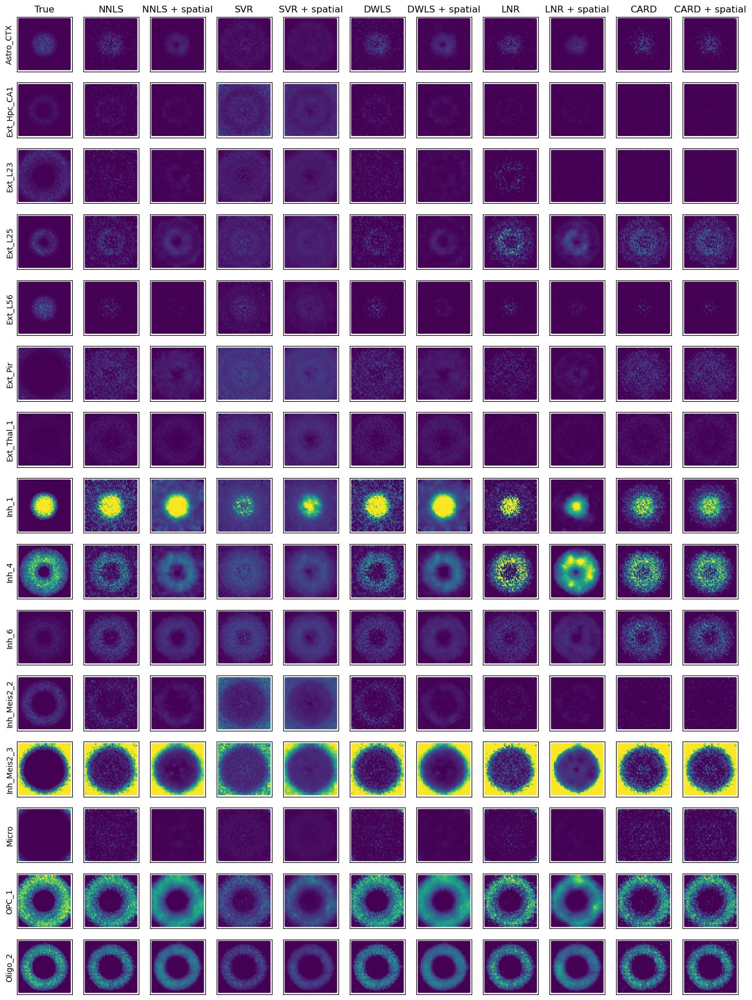

In [8]:
ct_to_plot = celltypes
ct_idx = [np.nonzero(celltypes == ct)[0].item() for ct in ct_to_plot]
coords = pd.read_csv(DATA_DIR + f"deconv_inputs/coords_exp{0}.csv", header = 0, index_col = 0)

# visualization
# colored by coefficients layer-by-layer
fig, axes = plt.subplots(
    len(ct_idx), len(method_names) + 1, 
    figsize=(1.5*(len(method_names) + 1), 1.5*len(ct_idx))
)
for i, idx in enumerate(ct_idx):
    if len(ct_idx) == 1:
        ax = axes
    else:
        ax = axes[i]
    ax[0].scatter(coords['x'], coords['y'], c = p_true_exp_list[0][:,idx], s = 3, vmin=0, vmax=0.6)
    
    for m, name in enumerate(method_names):
        ax[1 + m].scatter(coords['x'], coords['y'], c = p_inf_exp_list[0][m][:, idx], s = 3, vmin=0, vmax=0.6)
        if i == 0:
            ax[1 + m].set_title(name)
    
    ax[0].set_ylabel(celltypes[idx])

if len(ct_idx) == 1:
    ax = axes
else:
    ax = axes[0]
ax[0].set_title("True")

for ax in axes.flatten():
    ax.set_xticks([])
    ax.set_yticks([])
plt.show()

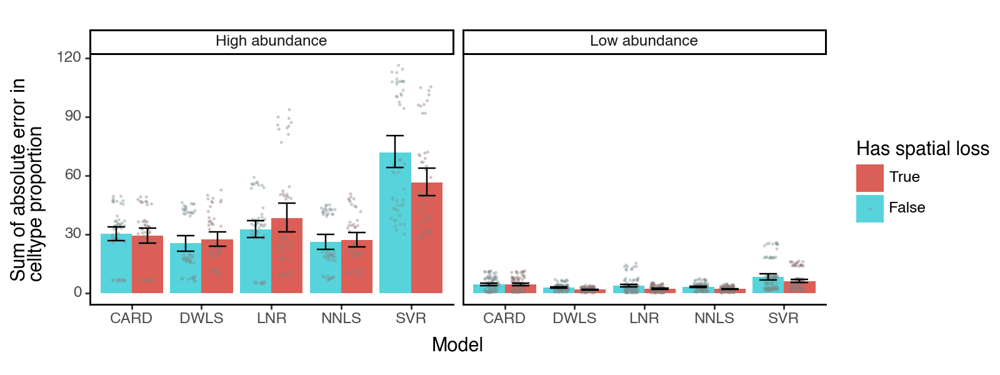

<Figure Size: (800 x 300)>

In [9]:
ggplot(abs_err_exp_df, aes(x='deconv_model', y = 'abs_error', group = 'model')) + \
    facet_wrap('~ class', scales = 'fixed', nrow=1) + \
    geom_bar(aes(fill = 'spatial_loss_class'),
                position = "dodge", stat = "summary",
                fun_y = np.mean) + \
    geom_point(aes(fill = 'spatial_loss_class'), 
                  position = position_jitterdodge(),
                  size = 0.1, color = 'gray', alpha = 0.3) + \
    geom_errorbar(stat = "summary", position = position_dodge(width=0.9)) + \
    labs(x = 'Model', y = 'Sum of absolute error in\ncelltype proportion', fill = 'Has spatial loss') + \
    theme_classic() + \
    theme(figure_size = (8, 3))

/var/folders/_f/m4v2g8c54gdfks59bp2f2cm80000gn/T/ipykernel_17543/427153704.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/jysumac/miniforge3/envs/smoother/lib/python3.10/site-packages/plotnine/themes/themeable.py:1902: FutureWarning: You no longer need to use subplots_adjust to make space for the legend or text around the panels. This paramater will be removed in a future version. You can still use 'plot_margin' 'panel_spacing' for your other spacing needs.


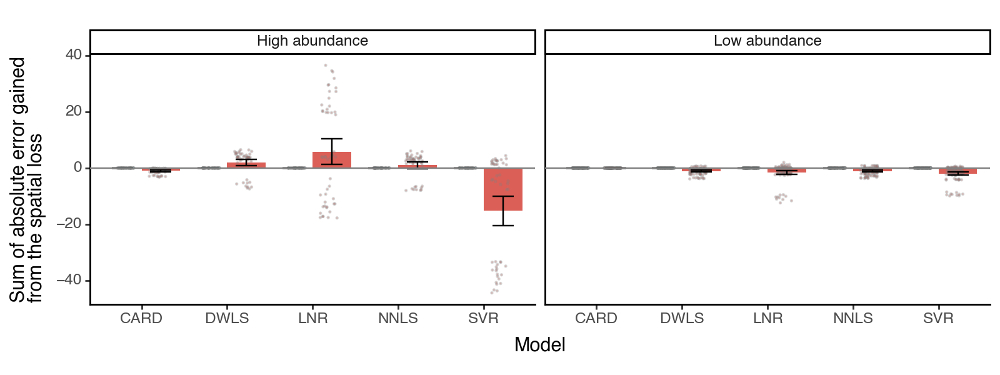

<Figure Size: (800 x 300)>

In [10]:
df = abs_err_exp_df.sort_values(by = ['cell_type', 'deconv_model', 'exp'])
df_diff_err = df[['cell_type', 'deconv_model', 'exp', 'class', 'spatial_loss', 'spatial_loss_class', 'model']]
df_diff_err['err_diff'] = df['abs_error'].to_numpy() - \
    np.repeat(df[~df.spatial_loss]['abs_error'].to_numpy(), 2)

ggplot(df_diff_err, aes(x='deconv_model', y = 'err_diff', fill = 'spatial_loss', group = 'model')) + \
    facet_wrap('~ class', scales = 'fixed', nrow=1) + \
    geom_bar(aes(fill = 'spatial_loss_class'),
                position = "dodge", stat = "summary",
                fun_y = np.mean) + \
    geom_point(aes(fill = 'spatial_loss_class'), 
                  position = position_jitterdodge(),
                  size = 0.1, color = 'gray', alpha=0.3) + \
    geom_errorbar(stat = "summary", position = position_dodge(width=0.9)) + \
    geom_hline(yintercept = 0, color = 'gray') + \
    labs(x = 'Model', y = 'Sum of absolute error gained\nfrom the spatial loss', fill = 'Has spatial loss') + \
    theme_classic() + \
    theme(figure_size = (8, 3), subplots_adjust={'wspace': 0.25}, legend_position='none')

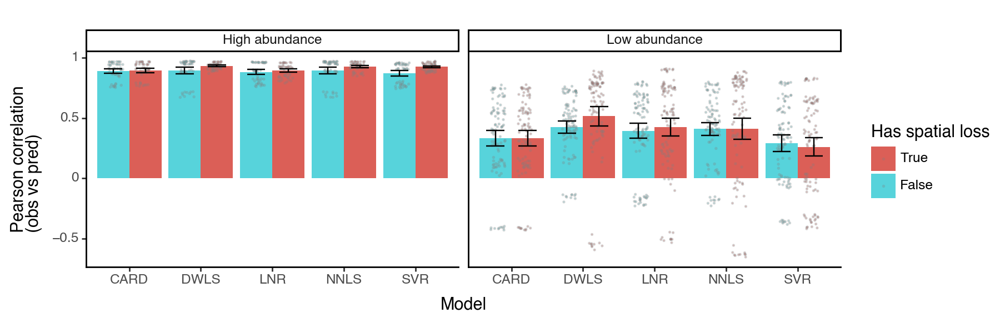

<Figure Size: (900 x 300)>

In [11]:
ggplot(corr_exp_df, aes(x='deconv_model', y = 'pearson_r', group = 'model')) + \
    facet_wrap('~ class', scales = 'fixed', nrow=1) + \
    geom_bar(aes(fill = 'spatial_loss_class'),
                position = "dodge", stat = "summary",
                fun_y = np.mean) + \
    geom_point(aes(fill = 'spatial_loss_class'), 
                  position = position_jitterdodge(),
                  size = 0.1, color = 'gray', alpha = 0.3) + \
    geom_errorbar(stat = "summary", position = position_dodge(width=0.9)) + \
    labs(x = 'Model', y = 'Pearson correlation\n(obs vs pred)', fill = 'Has spatial loss') + \
    theme_classic() + \
    theme(figure_size = (9, 3))

/var/folders/_f/m4v2g8c54gdfks59bp2f2cm80000gn/T/ipykernel_17543/2768743893.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/jysumac/miniforge3/envs/smoother/lib/python3.10/site-packages/plotnine/themes/themeable.py:1902: FutureWarning: You no longer need to use subplots_adjust to make space for the legend or text around the panels. This paramater will be removed in a future version. You can still use 'plot_margin' 'panel_spacing' for your other spacing needs.


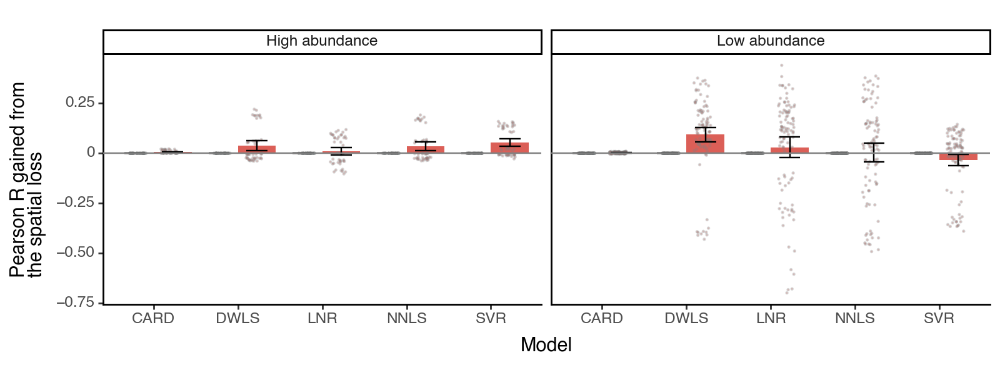

<Figure Size: (800 x 300)>

In [12]:
df = corr_exp_df.sort_values(by = ['cell_type', 'deconv_model', 'exp'])
df_diff_corr = df[['cell_type', 'deconv_model', 'exp', 'class', 'spatial_loss','spatial_loss_class', 'model']]
df_diff_corr['r_diff'] = df['pearson_r'].to_numpy() - \
    np.repeat(df[~df.spatial_loss]['pearson_r'].to_numpy(), 2)

ggplot(df_diff_corr, aes(x='deconv_model', y = 'r_diff', fill = 'spatial_loss', group = 'model')) + \
    facet_wrap('~ class', scales = 'fixed', nrow=1) + \
    geom_bar(aes(fill = 'spatial_loss_class'),
                position = "dodge", stat = "summary",
                fun_y = np.mean) + \
    geom_point(aes(fill = 'spatial_loss_class'), 
                  position = position_jitterdodge(),
                  size = 0.1, color = 'gray', alpha = 0.3) + \
    geom_errorbar(stat = "summary", position = position_dodge(width=0.9)) + \
    geom_hline(yintercept = 0, color = 'gray') + \
    labs(x = 'Model', y = 'Pearson R gained from\nthe spatial loss') + \
    theme_classic() + \
    theme(figure_size = (8, 3), subplots_adjust={'wspace': 0.25}, legend_position='none')

#### Binary prediction performance (ROC, PR)

In [13]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score

import matplotlib as mpl
from matplotlib import pyplot as plt
import numpy as np
from scipy import interpolate

from functools import partial
from itertools import cycle

def swap_return_order(f, order, *args, **kwargs):
    result = f(*args, **kwargs)
    return [result[i] for i in order]


with plt.style.context('seaborn'):
    seaborn_colors = mpl.rcParams['axes.prop_cycle'].by_key()['color']
    

def compute_curve(pos_cell_count, infer_cell_proportions, mode='macro', curve='AUC'):
    r"""
    :param pos_cell_count: binary matrix showing which cell types are present in which locations
    :param infer_cell_proportions: inferred locations (the higher the more cells)
    """
    predictor = infer_cell_proportions.values + np.random.gamma(20, 1e-12, infer_cell_proportions.shape)
    
    X = dict()
    Y = dict()
    scores = dict()
    
    if curve == 'ROC':
        # in this case X is FPR and Y is TPR
        curve_function = partial(swap_return_order, roc_curve, [1, 0, 2])
        score_function = roc_auc_score
        
    elif curve == 'PR':
        # in this case X is recall and Y is precision
        curve_function = precision_recall_curve
        score_function = average_precision_score
        
    for i, c in enumerate(infer_cell_proportions.columns):
        Y[c], X[c], _ = curve_function(pos_cell_count[:, i], predictor[:, i])
        scores[c] = score_function(pos_cell_count[:, i], predictor[:, i], average=mode)

    scores["averaged"] = score_function(pos_cell_count, predictor, average=mode)
    
    if mode == 'micro':
        Y["averaged"], X["averaged"], _ = curve_function(pos_cell_count.ravel(), predictor.ravel())

    elif mode == 'macro':
        Ys = []
        x_grid = np.linspace(0, 1, 2000)
        for i, c in enumerate(infer_cell_proportions.columns):
            f = interpolate.interp1d(X[c], Y[c])
            y_interp = f(x_grid)
            Ys.append(y_interp)

        X["averaged"] = x_grid
        Y['averaged'] = np.nanmean(Ys, axis=0)
    return X, Y, scores


compute_roc = partial(compute_curve, curve='ROC')
compute_precision_recall = partial(compute_curve, curve='PR')

In [14]:
method_names = ['NNLS', 'NNLS + spatial', 
                'SVR', 'SVR + spatial', 
                'DWLS', 'DWLS + spatial',
                'LNR', 'LNR + spatial'] + \
                ['NNLSC', 'NNLSC + spatial',
                    'SVRC', 'SVRC + spatial',
                    'DWLSC', 'DWLSC + spatial']
p_inf_all = np.concatenate(p_inf_exp_list, axis = 1)

print(p_inf_all.shape, p_true.shape)

df_p_inf_all = [pd.DataFrame(p, columns=design.index) for p in p_inf_all]
pos_cell_count = p_true >= 0.05

(10, 25000, 15) (25000, 15)


In [15]:
import warnings
with warnings.catch_warnings():
    warnings.simplefilter("ignore", category=RuntimeWarning)
    
    df_pr_exp_list = []
    for exp in range(NUM_EXP):
        pos_cell_count_exp = pos_cell_count.iloc[(2500*exp):(2500 + 2500*exp),:]

        df_pr_exp = design[['is_high_density']]
        for df, name in zip(df_p_inf_all, method_names):
            scores = compute_precision_recall(
                pos_cell_count_exp.values, 
                df.iloc[(2500*exp):(2500 + 2500*exp),:])[2]
            _df_pr = pd.DataFrame.from_dict(scores, orient='index', columns = [name])
            df_pr_exp = df_pr_exp.join(_df_pr)

        df_pr_exp['exp'] = exp
        df_pr_exp['cell_type'] = df_pr_exp.index
        df_pr_exp_list.append(df_pr_exp)

df_pr_scores = pd.concat(df_pr_exp_list)

/Users/jysumac/miniforge3/envs/smoother/lib/python3.10/site-packages/sklearn/metrics/_ranking.py:879: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
/Users/jysumac/miniforge3/envs/smoother/lib/python3.10/site-packages/sklearn/metrics/_ranking.py:879: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
/Users/jysumac/miniforge3/envs/smoother/lib/python3.10/site-packages/sklearn/metrics/_ranking.py:879: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
/Users/jysumac/miniforge3/envs/smoother/lib/python3.10/site-packages/sklearn/metrics/_ranking.py:879: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
/Users/jysumac/miniforge3/envs/smoother/lib/python3.10/site-packages/sklearn/metrics/_ranking.py:879: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
/Users/jysumac/miniforge3/envs/smoother/lib/p

In [16]:
df_pr_scores = pd.melt(
    df_pr_scores, id_vars=['is_high_density', 'exp', 'cell_type'],
    var_name='model', value_name='pr'
)
df_pr_scores['spatial_loss'] = df_pr_scores.model.str.contains('spatial')
df_pr_scores['spatial_loss_class'] = pd.Categorical(df_pr_scores.spatial_loss, [True, False])
df_pr_scores['deconv_model'] = df_pr_scores.model.str.split('+').str[0].str.strip()
df_pr_scores['class'] = np.where(df_pr_scores.is_high_density, 'High abundance', 'Low abundance')

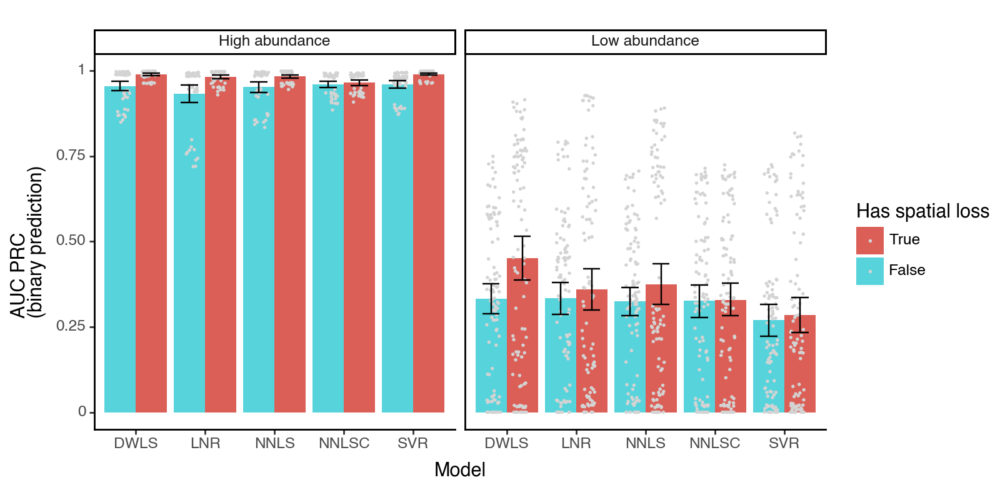

<Figure Size: (800 x 400)>

In [17]:
ggplot(df_pr_scores, aes(x='deconv_model', y = 'pr', group = 'model')) + \
    facet_wrap('~ class', scales = 'fixed', nrow=1) + \
    geom_bar(aes(fill = 'spatial_loss_class'),
                position = "dodge", stat = "summary",
                fun_y = np.mean) + \
    geom_point(aes(fill = 'spatial_loss_class'), 
                  position = position_jitterdodge(),
                  size = 0.1, color = 'lightgray') + \
    geom_errorbar(stat = "summary", position = position_dodge(width=0.9)) + \
    labs(x = 'Model', y = 'AUC PRC\n(binary prediction)', fill = 'Has spatial loss') + \
    theme_classic() + \
    theme(figure_size = (8, 4))

/var/folders/_f/m4v2g8c54gdfks59bp2f2cm80000gn/T/ipykernel_17543/95124749.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/jysumac/miniforge3/envs/smoother/lib/python3.10/site-packages/plotnine/themes/themeable.py:1902: FutureWarning: You no longer need to use subplots_adjust to make space for the legend or text around the panels. This paramater will be removed in a future version. You can still use 'plot_margin' 'panel_spacing' for your other spacing needs.


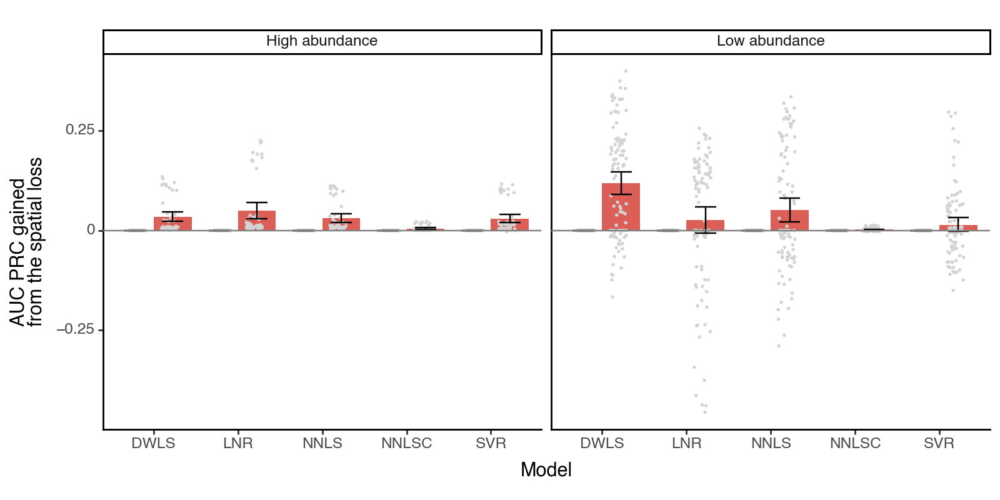

<Figure Size: (800 x 400)>

In [18]:
df = df_pr_scores.sort_values(by = ['cell_type', 'deconv_model', 'exp'])
df_diff_pr = df[['cell_type', 'deconv_model', 'exp', 'class', 'spatial_loss', 'spatial_loss_class', 'model']]
df_diff_pr['pr_diff'] = df['pr'].to_numpy() - \
    np.repeat(df[~df.spatial_loss]['pr'].to_numpy(), 2)

ggplot(df_diff_pr, aes(x='deconv_model', y = 'pr_diff', fill = 'spatial_loss', group = 'model')) + \
    facet_wrap('~ class', scales = 'fixed', nrow=1) + \
    geom_bar(aes(fill = 'spatial_loss_class'),
                position = "dodge", stat = "summary",
                fun_y = np.mean) + \
    geom_point(aes(fill = 'spatial_loss_class'), 
                  position = position_jitterdodge(),
                  size = 0.1, color = 'lightgray') + \
    geom_errorbar(stat = "summary", position = position_dodge(width=0.9)) + \
    geom_hline(yintercept = 0, color = 'gray') + \
    labs(x = 'Model', y = 'AUC PRC gained\nfrom the spatial loss', fill = 'Has spatial loss') + \
    theme_classic() + \
    theme(figure_size = (8, 4), subplots_adjust={'wspace': 0.25}, legend_position='none')